# Setup

In [70]:
import pandas as pd
import numpy as np

from tslearn.clustering import TimeSeriesKMeans
from tslearn.metrics import dtw
from tslearn.metrics import dtw_path
from minisom import MiniSom
import math
import matplotlib.pyplot as plt

In [14]:
def plot_som_series_averaged_center(som_x, som_y, win_map):
    fig, axs = plt.subplots(som_x,som_y,figsize=(40,40))
    fig.suptitle('Clusters')
    for x in range(som_x):
        for y in range(som_y):
            cluster = (x,y)
            if cluster in win_map.keys():
                for series in win_map[cluster]:
                    axs[cluster].plot(series,c="gray",alpha=0.5) 
                axs[cluster].plot(np.average(np.vstack(win_map[cluster]),axis=0),c="red")
            cluster_number = x*som_y+y+1
            axs[cluster].set_title(f"Cluster {cluster_number}")

    plt.show()

In [71]:
# dtw implementation minisom

def asymptotic_decay(learning_rate, t, max_iter):
    """Decay function of the learning process.
    Parameters
    ----------
    learning_rate : float
        current learning rate.

    t : int
        current iteration.

    max_iter : int
        maximum number of iterations for the training.
    """
    return learning_rate / (1+t/(max_iter/2))

class DtwSom(MiniSom):
    def __init__(self, x, y, input_len, sigma=1.0, learning_rate=0.5,
                 decay_function=asymptotic_decay,neighborhood_function='gaussian', random_seed=None,
                 gl_const=None, scr=None, ims=None):
        super().__init__(x, y, input_len, sigma=sigma, learning_rate=learning_rate,
                         decay_function=decay_function,
                         neighborhood_function=neighborhood_function, random_seed=random_seed)
        self.gl_const = gl_const
        self.scr = scr
        self.ims = ims

    def DTW_update(self, s1, s2, w):
        """find the best path"""
        best_path, distance = dtw_path(s1, s2, global_constraint=self.gl_const, sakoe_chiba_radius=self.scr,
                                       itakura_max_slope=self.ims)
        x_cords = []
        y_cords = []
        for i in best_path:
            x_cords += [round(i[0] * w + i[1] * (1 - w))]
            y_cords += [s1[i[0]] * w + s2[i[1]] * (1 - w)]
        s3 = []
        for j in range(len(s1)):
            sublistj = [y_cords[k] for k in np.where(np.isin(np.array(x_cords), j))[0]]
            if len(sublistj) != 0:
                s3 += [sum(sublistj) / len(sublistj)]
            else:
                s3 += [s3[-1]]
        return s3

    def _activate(self, x):
        """Updates matrix activation_map, in this matrix
           the element i,j is the response of the neuron i,j to x."""
        # s = subtract(x, self._weights)  # x - w
        it = np.nditer(self._activation_map, flags=['multi_index'])
        while not it.finished:
            # || x - w ||
            self._activation_map[it.multi_index] = dtw(x, self._weights[it.multi_index],
                                                      global_constraint=self.gl_const,
                                                       sakoe_chiba_radius=self.scr,itakura_max_slope=self.ims)
            it.iternext()

    def update(self, x, win, t, max_iteration):

        eta = self._decay_function(self._learning_rate, t, max_iteration)
        # sigma and learning rate decrease with the same rule
        sig = self._decay_function(self._sigma, t, max_iteration)
        # improves the performances
        g = self.neighborhood(win, sig) * eta
        it = np.nditer(g, flags=['multi_index'])

        while not it.finished:
            # eta * neighborhood_function * (x-w)
            self._weights[it.multi_index] = self.DTW_update(x, self._weights[it.multi_index], g[it.multi_index])
            it.iternext()

    def distance_map(self):
        """Returns the distance map of the weights.
        Each cell is the normalised sum of the distances between
        a neuron and its neighbours."""
        um = zeros((self._weights.shape[0], self._weights.shape[1]))
        it = np.nditer(um, flags=['multi_index'])
        while not it.finished:
            for ii in range(it.multi_index[0] - 1, it.multi_index[0] + 2):
                for jj in range(it.multi_index[1] - 1, it.multi_index[1] + 2):
                    if (ii >= 0 and ii < self._weights.shape[0] and
                            jj >= 0 and jj < self._weights.shape[1]):
                        w_1 = self._weights[ii, jj, :]
                        w_2 = self._weights[it.multi_index]
                        um[it.multi_index] += dtw(w_1, w_2,global_constraint=self.gl_const,
                                                  sakoe_chiba_radius=self.scr,itakura_max_slope=self.ims)
            it.iternext()
        um = um / um.max()
        return um

    def quantization_error(self, data):
        """Returns the quantization error computed as the average
        distance between each input sample and its best matching unit."""
        self._check_input_len(data)
        error = 0
        for x in data:
            error += dtw(x, self._weights[self.winner(x)],global_constraint=self.gl_const,
                         sakoe_chiba_radius=self.scr,itakura_max_slope=self.ims)
        return error / len(data)

# BIDMC clustering

In [145]:
df = pd.read_parquet('data/bidmc_heartbeats.parquet')
df.reset_index(inplace=True)
df.drop(columns=['index'], inplace=True)
df.head()

,Record,ECG_Signal,Database,heartbeats
0,bidmc01,"[0.7254772105499813, 0.6705965828174644, 0.609...",BIDMC,"[[-0.3444346857093896, -0.33571903574355677, -..."
1,bidmc02,"[0.744148552659688, 0.7402264473403118, 0.7402...",BIDMC,"[[-0.009753294018301344, -0.007787653067576743..."
2,bidmc03,"[0.43966109312054313, 0.42980742934729727, 0.4...",BIDMC,"[[-0.021853332805636262, -0.023124486765945407..."
3,bidmc04,"[1.0215604262697697, 1.0960718157329732, 1.005...",BIDMC,"[[-0.0337790710475509, -0.0323977912322716, -0..."
4,bidmc05,"[0.7207022311436104, 0.7050734163247091, 0.685...",BIDMC,"[[-0.06623790028537076, -0.06450740291975579, ..."


In [147]:
df_heartbeats = df['heartbeats'].explode('heartbeats')

In [152]:
df_heartbeats = df_heartbeats.to_frame(name="heartbeats")

In [153]:
df_heartbeats.shape

(35986, 1)

In [154]:
df_heartbeats['heartbeats_scaled'] = df_heartbeats['heartbeats'].apply(lambda x: (x - np.min(x)) / (np.max(x) - np.min(x)))
df_heartbeats.head()

,heartbeats,heartbeats_scaled
0,"[-0.3444346857093896, -0.33571903574355677, -0...","[0.0, 0.0066400048845066065, 0.010285037478915..."
1,"[-0.15830688216913819, -0.14232162373804977, -...","[0.0, 0.013255727306436607, 0.0224427610062052..."
2,"[-0.12400683364638838, -0.11990241192593504, -...","[0.041128727308302776, 0.04465940562457017, 0...."
3,"[-0.10599171916390215, -0.10029005751891715, -...","[0.0319576092523404, 0.037113326024985564, 0.0..."
4,"[-0.10953415372863967, -0.10577228424217083, -...","[0.05189467572434157, 0.055397496032087434, 0...."


In [ ]:
inertia = []
for i in range(1, 100):
    print(i)
    kmeans = TimeSeriesKMeans(n_clusters=i, metric="dtw", max_iter=5, n_jobs=-1).fit(df_heartbeats['heartbeats_scaled'].tolist())
    inertia.append(kmeans.inertia_)

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70


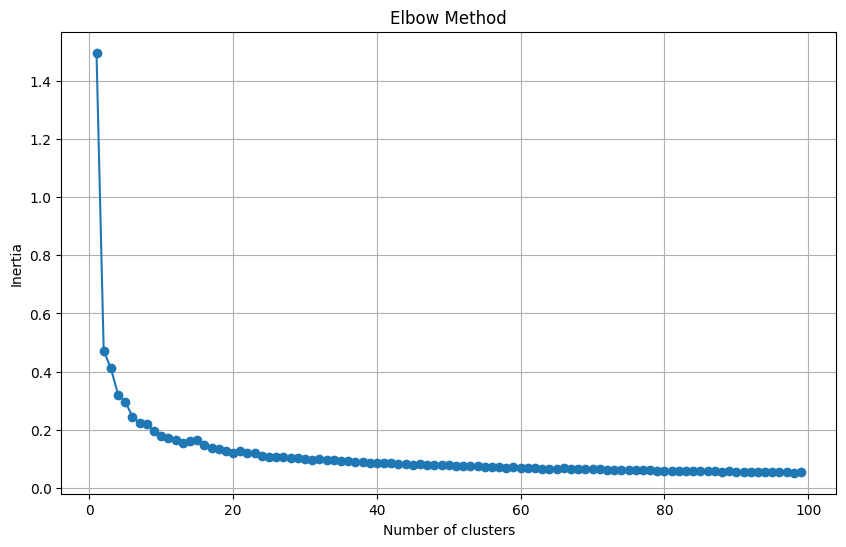

In [161]:
plt.figure(figsize=(10, 6))
plt.plot(range(1, 100), inertia, marker='o')
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.grid()
plt.show()

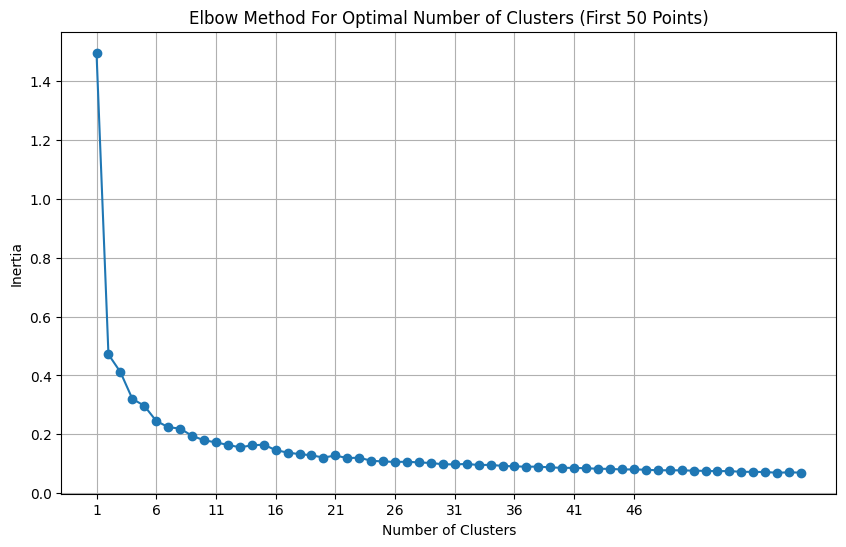

In [166]:
# Plotting the inertia values
plt.figure(figsize=(10, 6))
plt.plot(range(1, 61), inertia[0:60], marker='o')
plt.title('Elbow Method For Optimal Number of Clusters (First 50 Points)')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.xticks(range(1, 51, 5))  # Adjust as needed for readability
plt.grid(True)
plt.show()

In [179]:
num_clusters = 50
kmeans = TimeSeriesKMeans(n_clusters=num_clusters, metric="dtw", max_iter=5, n_jobs=-1)
clusters = kmeans.fit_predict(df_heartbeats['heartbeats_scaled'].tolist())

In [180]:
df_heartbeats['clusters'] = clusters

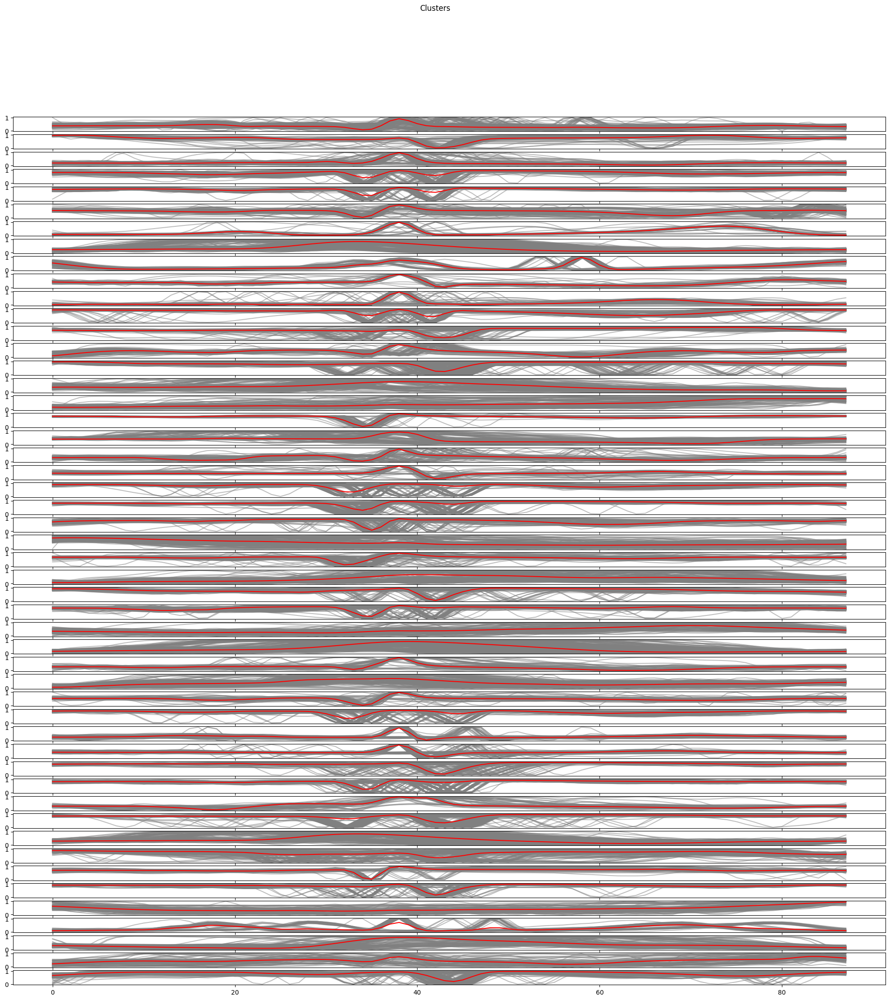

In [181]:
fig, axs = plt.subplots(num_clusters,1,figsize=(25,25))
fig.suptitle('Clusters')
for cl in range(0, num_clusters):
    cluster_df = df_heartbeats[df_heartbeats['clusters'] == cl]
    for series in cluster_df['heartbeats_scaled'].tolist():
        axs[cl].plot(series,c="gray",alpha=0.5) 
    axs[cl].plot(np.average(cluster_df['heartbeats_scaled'],axis=0),c="red")

# Fantasia clustering

In [2]:
df = pd.read_parquet('data/fantasia_heartbeats.parquet')
df.reset_index(inplace=True)
df.drop(columns=['index'], inplace=True)
df.head()

,Record,ECG_Signal,Database,heartbeats
0,f1y01,"[-0.01037701475042078, -0.00728331030172388, -...",Fantasia,"[[0.04644103397787518, 0.04516551334213771, 0...."
1,f2o01,"[-0.01037701475042078, -0.00728331030172388, -...",Fantasia,"[[0.04644103397787518, 0.04516551334213771, 0...."
2,f2o03,"[-0.01037701475042078, -0.00728331030172388, -...",Fantasia,"[[0.04644103397787518, 0.04516551334213771, 0...."
3,f1y03,"[-0.01037701475042078, -0.00728331030172388, -...",Fantasia,"[[0.04644103397787518, 0.04516551334213771, 0...."
4,f1y02,"[-0.01037701475042078, -0.00728331030172388, -...",Fantasia,"[[0.04644103397787518, 0.04516551334213771, 0...."


In [3]:
df_heartbeats = df['heartbeats'].explode('heartbeats')

In [4]:
df_heartbeats = df_heartbeats.to_frame(name="heartbeats")

In [5]:
df_heartbeats.shape

(61080, 1)

In [6]:
df_heartbeats['heartbeats_scaled'] = df_heartbeats['heartbeats'].apply(lambda x: (x - np.min(x)) / (np.max(x) - np.min(x)))
df_heartbeats.head()

,heartbeats,heartbeats_scaled
0,"[0.04644103397787518, 0.04516551334213771, 0.0...","[0.5016873078310278, 0.49567444786170073, 0.48..."
1,"[-0.007666336313692869, -0.007557630458040388,...","[0.027593830534071738, 0.03752531974863694, 0...."
2,"[-0.007693792819581349, -0.007733385859918884,...","[0.02231802893331669, 0.02168594752452738, 0.0..."
3,"[-0.001443892810398624, -0.0018004499429276147...","[0.783091574779025, 0.7203944166834823, 0.6736..."
4,"[-0.007289115662570772, -0.007408225996550551,...","[0.01509833989570814, 0.014174930850297186, 0...."


In [7]:
"""
inertia_fantasia = []
for i in range(1, 100):
    print(i)
    kmeans = TimeSeriesKMeans(n_clusters=i, metric="dtw", max_iter=5, n_jobs=-1).fit(df_heartbeats['heartbeats_scaled'].tolist())
    inertia_fantasia.append(kmeans.inertia_)
"""

'\ninertia_fantasia = []\nfor i in range(1, 100):\n    print(i)\n    kmeans = TimeSeriesKMeans(n_clusters=i, metric="dtw", max_iter=5, n_jobs=-1).fit(df_heartbeats[\'heartbeats_scaled\'].tolist())\n    inertia_fantasia.append(kmeans.inertia_)\n'

In [9]:
heartbeats = np.array(df_heartbeats['heartbeats_scaled'].tolist())
heartbeats.shape

(61080, 88)

In [20]:
som_x = som_y = math.ceil(math.sqrt(math.sqrt(len(heartbeats))))

In [21]:
som_x

16

In [22]:
som = MiniSom(som_x, som_y, len(heartbeats[0]), sigma=0.1, learning_rate=0.05)

som.random_weights_init(heartbeats)
som.train(heartbeats, 1000000, verbose=True)

 [ 1000000 / 1000000 ] 100% - 0:00:00 left 
 quantization error: 0.2999408734112311


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/minisom.py:536: RuntimeWarning: invalid value encountered in sqrt
  return sqrt(-2 * cross_term + input_data_sq + weights_flat_sq.T)


In [23]:
win_map = som.win_map(heartbeats)

In [24]:
num_clusters = len(win_map.keys())
num_clusters

255

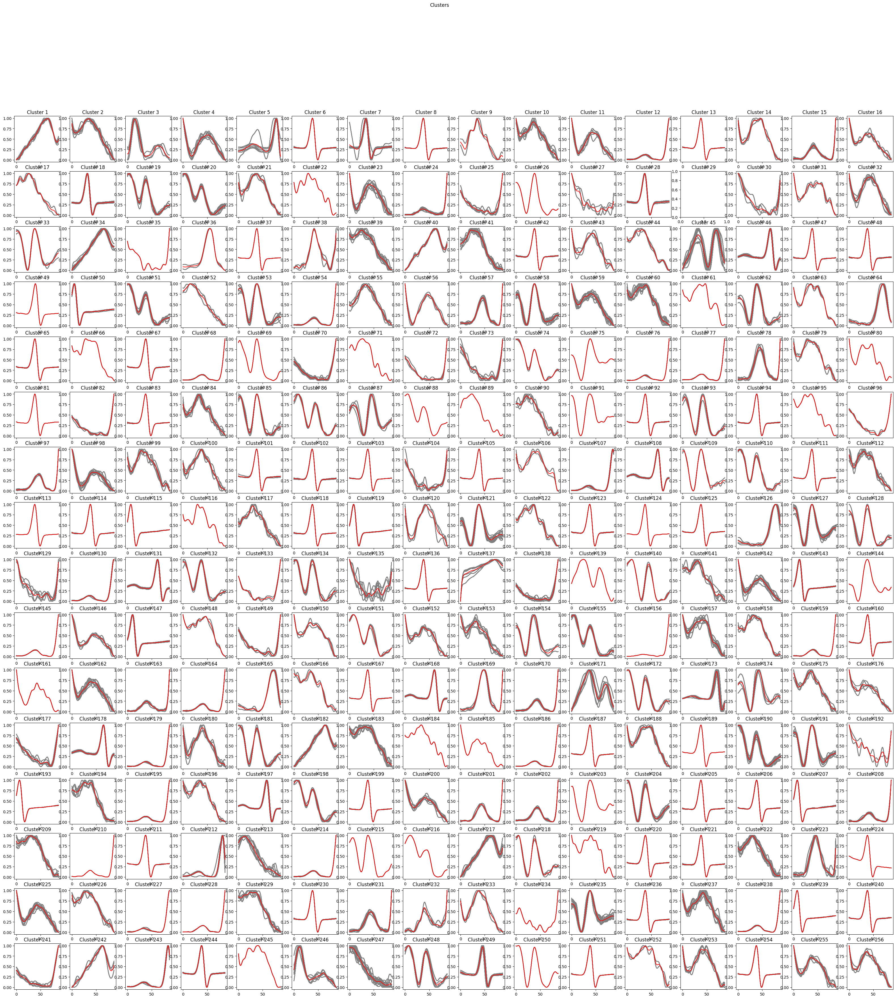

In [25]:
plot_som_series_averaged_center(som_x, som_y, win_map)

# Capnobase clustering

In [26]:
df = pd.read_parquet('data/capnobase_heartbeats.parquet')
df.reset_index(inplace=True)
df.drop(columns=['index'], inplace=True)
df.head()

,Record,ECG_Signal,Database,heartbeats
0,0025,"[-1.4, -1.22, -1.04, -0.92, -0.85, -0.77, -0.6...",Capnobase,"[[1.3426467131759945, 1.3332179788835592, 1.27..."
1,0008,"[-1.74, -1.68, -1.6, -1.51, -1.42, -1.31, -1.1...",Capnobase,"[[-0.8688998598411204, -0.7678329979068909, -0..."
2,0365,"[-0.96, -0.93, -0.9, -0.84, -0.76, -0.7, -0.66...",Capnobase,"[[0.5152411850538428, 0.5234763469892236, 0.51..."
3,0311,"[-1.68, -1.55, -1.44, -1.4, -1.36, -1.32, -1.3...",Capnobase,"[[-0.5834801362365654, -0.5384746937360153, -0..."
4,0006,"[0.2, 0.36, 0.46, 0.51, 0.57, 0.68, 0.88, 1.12...",Capnobase,"[[-0.03052813104513363, 0.01986659284324965, 0..."


In [27]:
df_heartbeats = df['heartbeats'].explode('heartbeats')

In [28]:
df_heartbeats = df_heartbeats.to_frame(name="heartbeats")

In [29]:
df_heartbeats.shape

(6808, 1)

In [30]:
df_heartbeats['heartbeats_scaled'] = df_heartbeats['heartbeats'].apply(lambda x: (x - np.min(x)) / (np.max(x) - np.min(x)))
df_heartbeats.head()

,heartbeats,heartbeats_scaled
0,"[1.3426467131759945, 1.3332179788835592, 1.279...","[0.35281087492371754, 0.35237809850425716, 0.3..."
1,"[0.8930052945742477, 0.8925269029123397, 0.852...","[0.32166547028531056, 0.32164346421310774, 0.3..."
2,"[0.8657794007043214, 0.8423153374589414, 0.776...","[0.31312312358224004, 0.31205477865986264, 0.3..."
3,"[0.855389885168873, 0.8065329205986527, 0.7093...","[0.3138383717024108, 0.3115909919125077, 0.307..."
4,"[0.9367443976861078, 0.8915691859161567, 0.800...","[0.31586394418875974, 0.313779645051345, 0.309..."


In [31]:
"""
inertia_fantasia = []
for i in range(1, 100):
    print(i)
    kmeans = TimeSeriesKMeans(n_clusters=i, metric="dtw", max_iter=5, n_jobs=-1).fit(df_heartbeats['heartbeats_scaled'].tolist())
    inertia_fantasia.append(kmeans.inertia_)
"""

'\ninertia_fantasia = []\nfor i in range(1, 100):\n    print(i)\n    kmeans = TimeSeriesKMeans(n_clusters=i, metric="dtw", max_iter=5, n_jobs=-1).fit(df_heartbeats[\'heartbeats_scaled\'].tolist())\n    inertia_fantasia.append(kmeans.inertia_)\n'

In [32]:
heartbeats = np.array(df_heartbeats['heartbeats_scaled'].tolist())
heartbeats.shape

(6808, 88)

In [116]:
som_x = som_y = math.ceil(math.sqrt(5*math.sqrt(len(heartbeats))))

In [117]:
#som_x = som_y = 15
som_x

21

In [134]:
som = DtwSom(som_x, som_y, len(heartbeats[0]), sigma=0.5, learning_rate=0.01)

som.random_weights_init(heartbeats)
som.train(heartbeats, 10000, verbose=True) #todo: increase iterations

 [ 10000 / 10000 ] 100% - 0:00:01 left 
 quantization error: 0.12828631521510678


In [135]:
win_map = som.win_map(heartbeats)

In [136]:
num_clusters = len(win_map.keys())
num_clusters

439

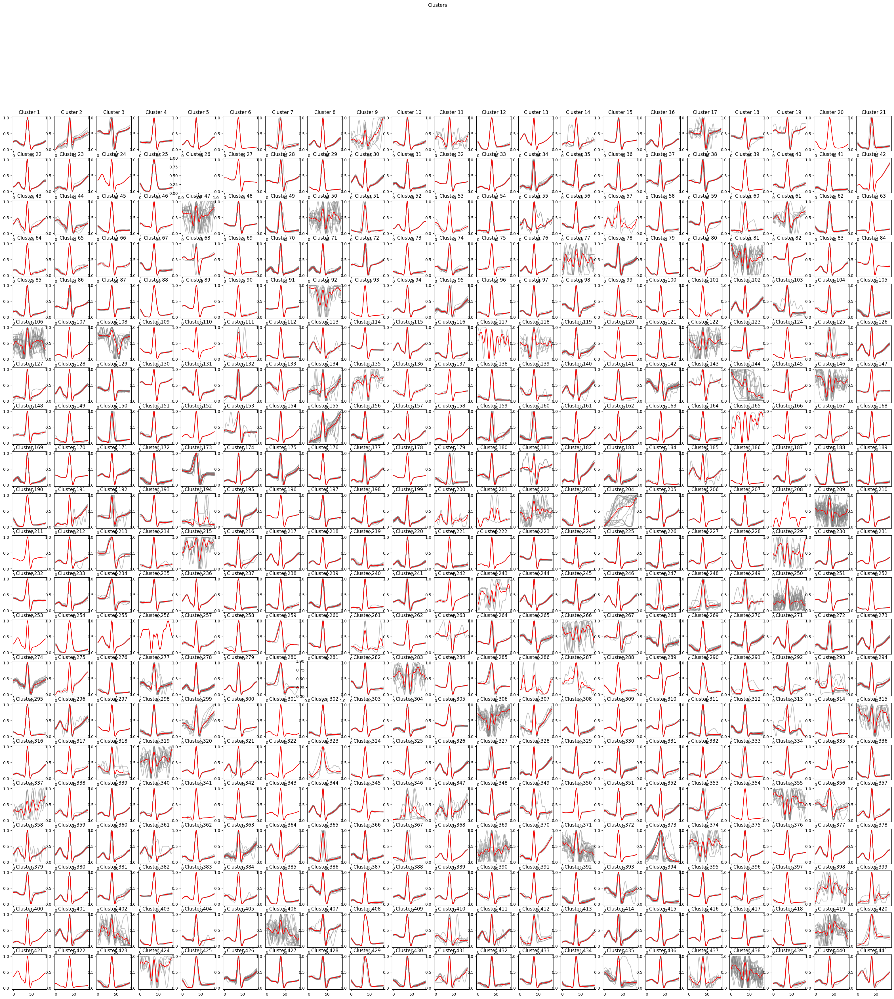

In [137]:
plot_som_series_averaged_center(som_x, som_y, win_map)

In [138]:
# minisom - using euclidian distance instead of dtw

som = MiniSom(som_x, som_y, len(heartbeats[0]), sigma=0.5, learning_rate=0.01)

som.random_weights_init(heartbeats)
som.train(heartbeats, 10000, verbose=True)

 [ 10000 / 10000 ] 100% - 0:00:00 left 
 quantization error: 0.2620262055293399


In [139]:
win_map = som.win_map(heartbeats)

In [140]:
num_clusters = len(win_map.keys())
num_clusters

440

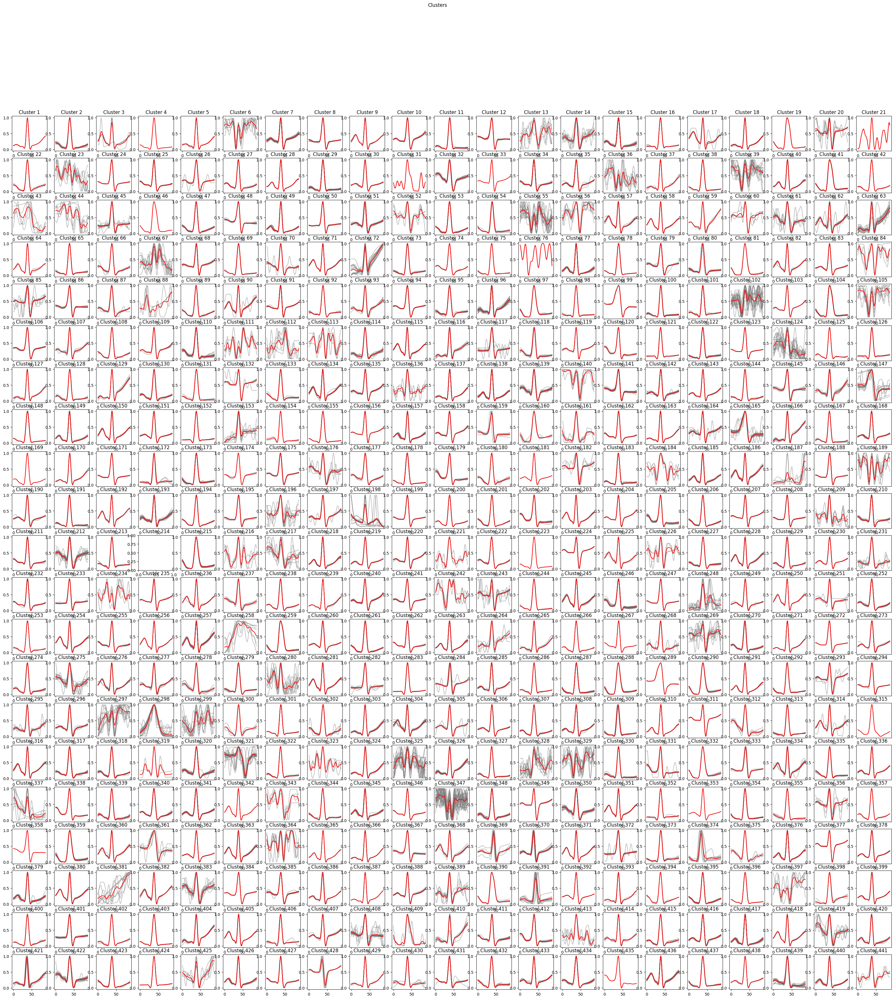

In [141]:
plot_som_series_averaged_center(som_x, som_y, win_map)

# Other

```
1st step: standard cluster analysis (without considering time series component)
2nd step: move to time series cluster analysis
```

In [ ]:
heartbeats = np.array(df['heartbeats_scaled'].tolist())
heartbeats.shape

(103874, 88)

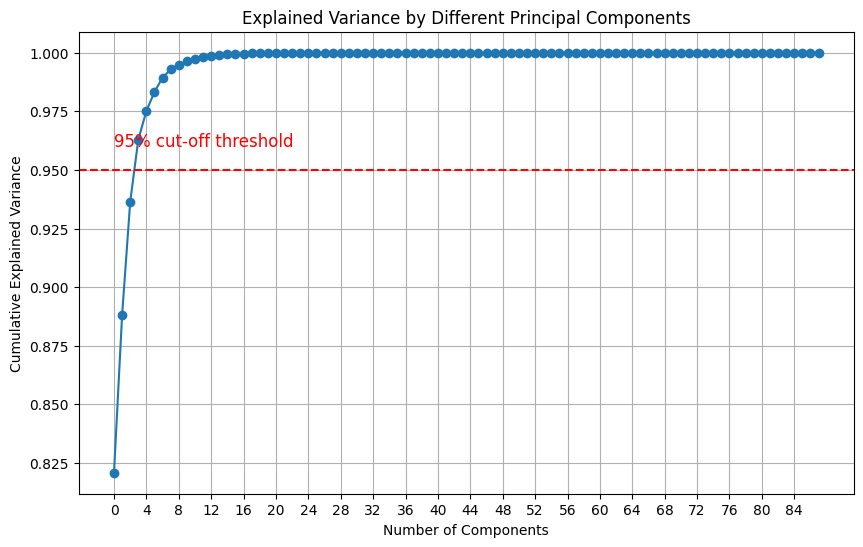

In [ ]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

# Assuming your DataFrame is named 'df'
# Standardize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(df_heartbeats)

# Apply PCA
pca = PCA()
pca_data = pca.fit_transform(df_heartbeats)

# Explained variance ratio
explained_variance = pca.explained_variance_ratio_
cumulative_explained_variance = explained_variance.cumsum()

# Plotting the Cumulative Explained Variance
plt.figure(figsize=(10, 6))
plt.plot(cumulative_explained_variance, marker='o')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')
plt.title('Explained Variance by Different Principal Components')

# Draw a line at the 95% threshold
plt.axhline(y=0.95, color='r', linestyle='--')
plt.text(0, 0.96, '95% cut-off threshold', color = 'red', fontsize=12)

# More granular x-axis labels
plt.xticks(np.arange(0, len(cumulative_explained_variance), step=max(1, len(cumulative_explained_variance)//20)))

plt.grid()
plt.show()


In [60]:
num_components = 10 

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to '

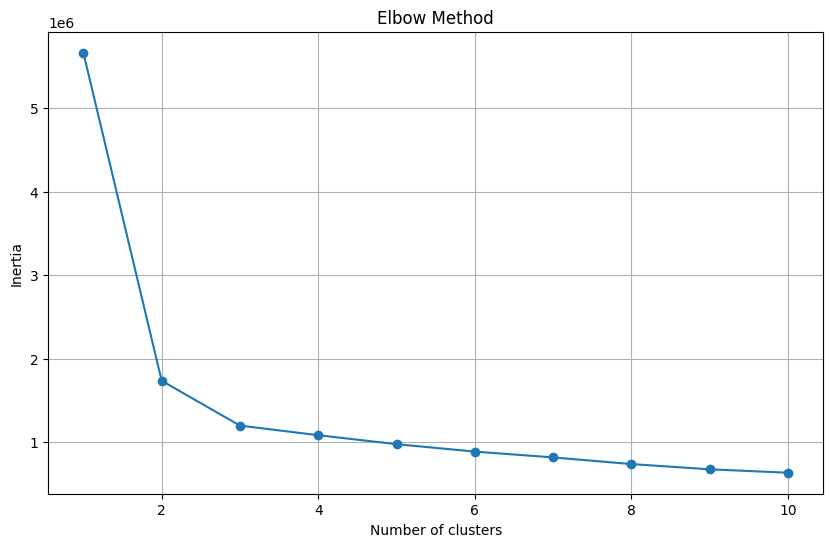

In [61]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Select only the number of components you identified
pca_data_reduced = pca_data[:, :num_components]  # replace 'num_components' with your identified number

# Elbow Method to determine the optimal number of clusters
inertia = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, random_state=0).fit(pca_data_reduced)
    inertia.append(kmeans.inertia_)

plt.figure(figsize=(10, 6))
plt.plot(range(1, 11), inertia, marker='o')
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.grid()
plt.show()

In [62]:
k = 3
kmeans = KMeans(n_clusters=k, random_state=0)
clusters = kmeans.fit_predict(pca_data_reduced)

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [63]:
df['cluster'] = clusters
df

,heartbeats,heartbeats_scaled,len,cluster
0,"[-0.3444346857093896, -0.33571903574355677, -0...","[0.0, 0.0066400048845066065, 0.010285037478915...",88,0
1,"[-0.15830688216913819, -0.14232162373804977, -...","[0.0, 0.013255727306436607, 0.0224427610062052...",88,0
2,"[-0.12400683364638838, -0.11990241192593504, -...","[0.041128727308302776, 0.04465940562457017, 0....",88,0
3,"[-0.10599171916390215, -0.10029005751891715, -...","[0.0319576092523404, 0.037113326024985564, 0.0...",88,0
4,"[-0.10953415372863967, -0.10577228424217083, -...","[0.05189467572434157, 0.055397496032087434, 0....",88,0
...,...,...,...,...
103869,"[-0.044310271934587926, -0.07375668645609265, ...","[0.30795863344596847, 0.3069849887830855, 0.30...",88,2
103870,"[-0.027936742062994346, -0.07097524012741266, ...","[0.30350429903431403, 0.3020749127545052, 0.29...",88,2
103871,"[-0.21013019212311362, -0.22266998998139106, -...","[0.2947630035779988, 0.2943486420569904, 0.293...",88,2
103872,"[-0.2247275335307467, -0.22500122276155649, -0...","[0.29416028173009395, 0.294151154981432, 0.293...",88,2


time series cluster analysis

In [39]:
from tslearn.clustering import TimeSeriesKMeans
from tslearn.preprocessing import TimeSeriesScalerMeanVariance

# Scale the data (if not already scaled)
scaler = TimeSeriesScalerMeanVariance()
scaled_data = scaler.fit_transform(df_heartbeats)

# Using DTW with k-means
model = TimeSeriesKMeans(n_clusters=3, metric="dtw", max_iter=5, n_jobs=-1)
clusters = model.fit_predict(scaled_data)

# clusters now contains the cluster assignment for each heartbeat


In [43]:
clusters

array([0, 0, 0, ..., 0, 0, 0])

In [ ]:
for i in range(10, 30):
    kmeans = TimeSeriesKMeans(n_clusters=i, metric="dtw", max_iter=5, n_jobs=-1).fit(scaled_data)
    inertia.append(kmeans.inertia_)

plt.figure(figsize=(10, 6))
plt.plot(range(1, 30), inertia, marker='o')
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.grid()
plt.show()

In [95]:
inertia

[5666135.427040966,
 1736924.2013254662,
 1199969.0996451406,
 1084877.6250496441,
 977619.9345311713,
 888621.3335747258,
 818696.2075925235,
 739264.5653149643,
 676357.8706703777,
 635506.568521316,
 6.651818957587769,
 6.3236332743200965,
 5.783298772440887,
 5.51613372751218,
 5.301822078100005,
 4.96101299114115,
 4.7202413434639725,
 4.534278179859872,
 4.5178249278101825,
 4.208458516281081,
 4.028219701798277,
 3.8140515199012244,
 3.6499858956836344,
 3.519302255446063,
 3.6010503249435653,
 3.2224352312559934,
 3.3346047188152896,
 3.1266588589819686,
 3.2303585603499827,
 3.0338755522871756]

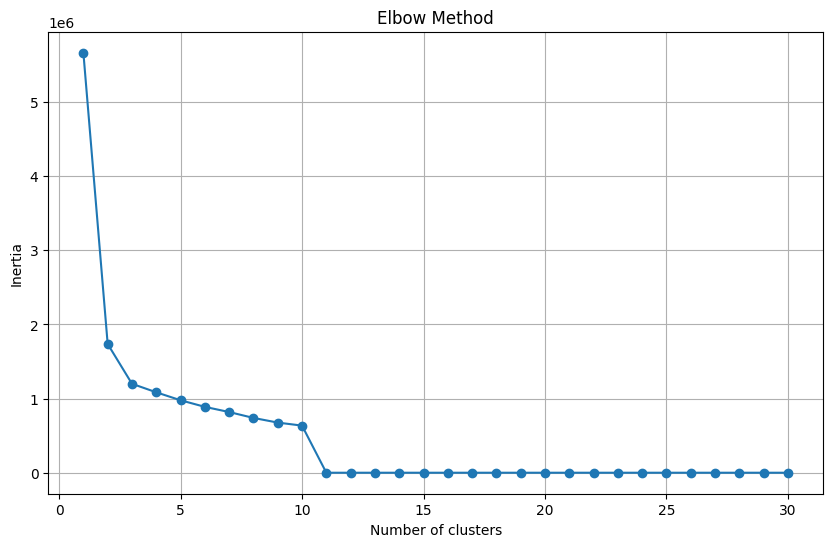

In [98]:
plt.figure(figsize=(10, 6))
plt.plot(range(1, 30+1), inertia, marker='o')
plt.title('Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.grid()
plt.show()

In [97]:
len(inertia)

30

In [99]:
num_clusters = 12
kmeans = TimeSeriesKMeans(n_clusters=num_clusters, metric="dtw", max_iter=5, n_jobs=-1)
clusters = kmeans.fit_predict(heartbeats)

In [100]:
clusters

array([10, 10, 11, ..., 10, 10,  4])

In [101]:
df['cluster'] = clusters
df

,heartbeats,heartbeats_scaled,len,cluster
0,"[-0.3444346857093896, -0.33571903574355677, -0...","[0.0, 0.0066400048845066065, 0.010285037478915...",88,10
1,"[-0.15830688216913819, -0.14232162373804977, -...","[0.0, 0.013255727306436607, 0.0224427610062052...",88,10
2,"[-0.12400683364638838, -0.11990241192593504, -...","[0.041128727308302776, 0.04465940562457017, 0....",88,11
3,"[-0.10599171916390215, -0.10029005751891715, -...","[0.0319576092523404, 0.037113326024985564, 0.0...",88,11
4,"[-0.10953415372863967, -0.10577228424217083, -...","[0.05189467572434157, 0.055397496032087434, 0....",88,10
...,...,...,...,...
103869,"[-0.044310271934587926, -0.07375668645609265, ...","[0.30795863344596847, 0.3069849887830855, 0.30...",88,4
103870,"[-0.027936742062994346, -0.07097524012741266, ...","[0.30350429903431403, 0.3020749127545052, 0.29...",88,4
103871,"[-0.21013019212311362, -0.22266998998139106, -...","[0.2947630035779988, 0.2943486420569904, 0.293...",88,10
103872,"[-0.2247275335307467, -0.22500122276155649, -0...","[0.29416028173009395, 0.294151154981432, 0.293...",88,10


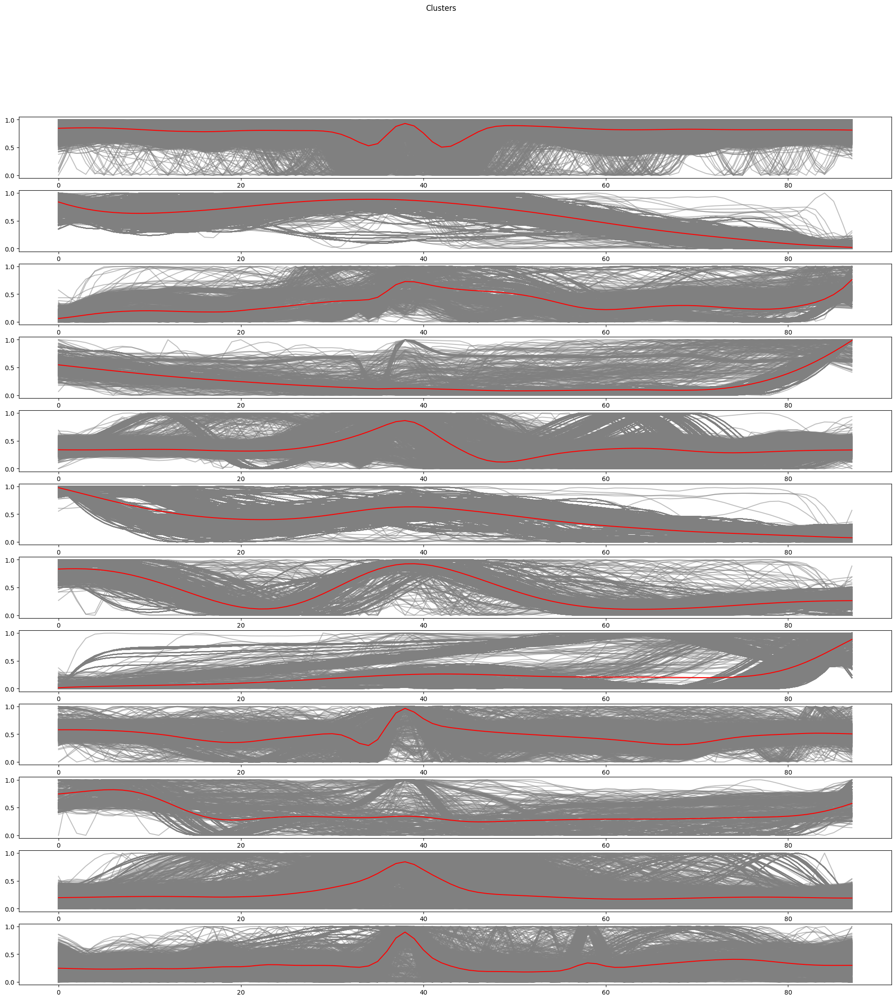

In [102]:
fig, axs = plt.subplots(num_clusters,1,figsize=(25,25))
fig.suptitle('Clusters')
for cl in range(0, num_clusters):
    cluster_df = df[df['cluster'] == cl]
    for series in cluster_df['heartbeats_scaled'].tolist():
        axs[cl].plot(series,c="gray",alpha=0.5) 
    axs[cl].plot(np.average(cluster_df['heartbeats_scaled'],axis=0),c="red")